In [6]:
# importing the required libraries
import csv
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import cv2
import os
import PIL
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
from tensorflow.keras.callbacks import ModelCheckpoint

In [7]:
# ls

In [8]:
# Obtaining the directory of the dataset
data_dir = "./joined_solar_panels_augmented/"
data_dir

'./joined_solar_panels_augmented/'

In [9]:
# Getting the names of the files in the directory 
os.listdir(data_dir)

['all_snow', 'no_snow', 'partial_snow']

In [10]:
# file = ".DS_Store"

# bad_path = os.path.join(data_dir, file)
# os.remove(bad_path)

In [11]:
# Converting the data directory into a pathlib
import pathlib
data_dir = pathlib.Path(data_dir)
data_dir

WindowsPath('joined_solar_panels_augmented')

In [12]:
# Obtaining a list of images with extensuion jpg
list(data_dir.glob("*/*.jpg"))

[WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_0a7c934d-d070-40a2-8fb2-8e706d0730e7.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_0e1a48f9-168c-4d68-8ff1-816b1dc10a7f.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_19ba9d32-eb8e-4265-9d86-3fbb72c9c841.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_1c3fc603-32f6-40da-aa72-95017b110f62.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_2972be37-5ab4-4d0d-94d0-914bb862df76.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_31bf3029-ceee-4969-9411-cfc689b5983b.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_3c08212f-0e46-4dff-b2ec-9a49a5f32f14.jpg'),

In [13]:
# Getting the total number of images in the dataset
image_count = len(list(data_dir.glob("*/*.jpg")))
image_count

4770

In [14]:
# Getting a list of the first 5 all snow solar panels
all_snow = list(data_dir.glob("all_snow/*"))
all_snow[:5]

[WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_0a7c934d-d070-40a2-8fb2-8e706d0730e7.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_0e1a48f9-168c-4d68-8ff1-816b1dc10a7f.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_19ba9d32-eb8e-4265-9d86-3fbb72c9c841.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_1c3fc603-32f6-40da-aa72-95017b110f62.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_2972be37-5ab4-4d0d-94d0-914bb862df76.jpg')]

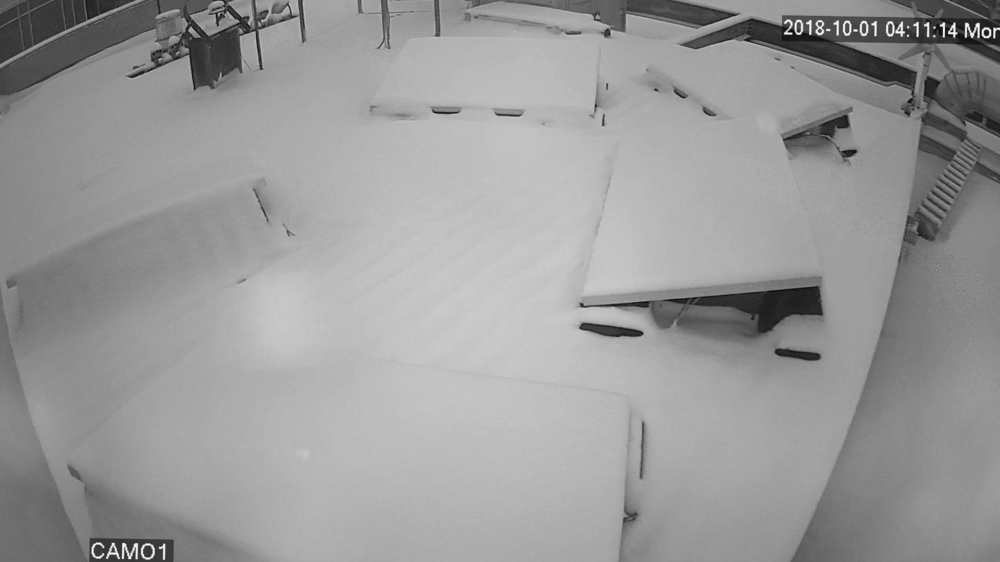

In [15]:
# Showing an all snow image
PIL.Image.open(str(all_snow[1]))

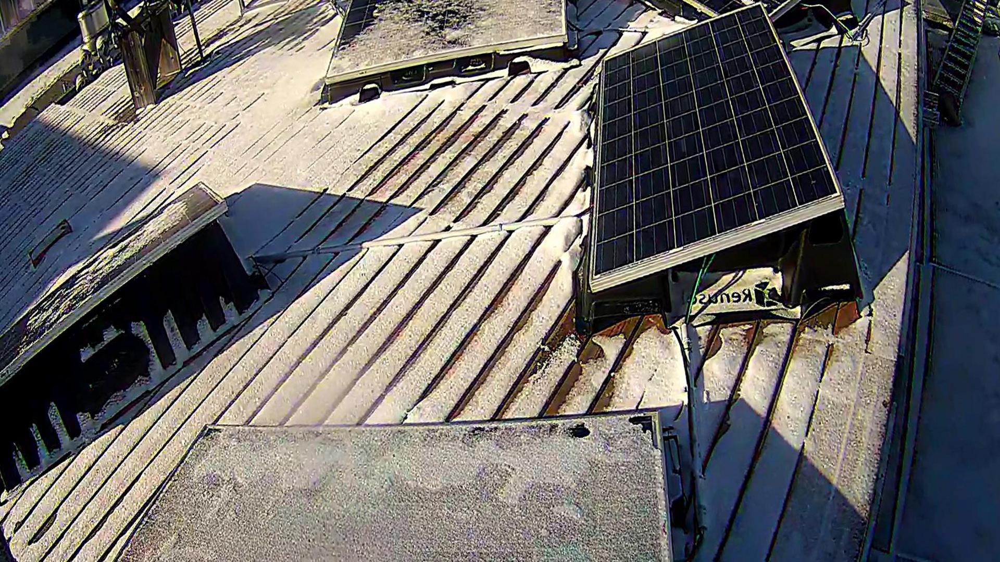

In [16]:
# Showing a no snow image
no_snow = list(data_dir.glob("no_snow/*"))
PIL.Image.open(str(no_snow[1]))

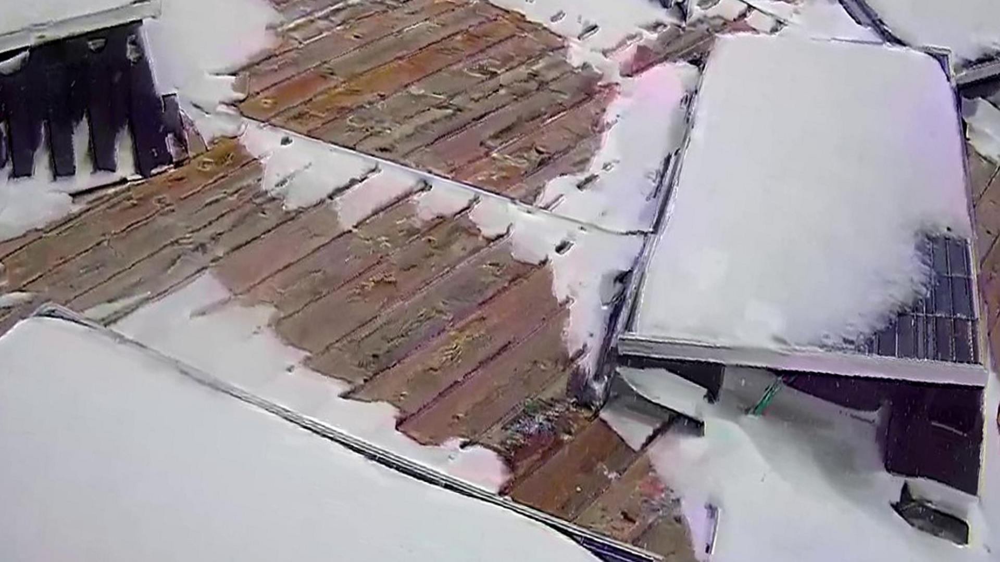

In [17]:
# Showing a partial snow image
partial_snow = list(data_dir.glob("partial_snow/*"))
PIL.Image.open(str(partial_snow[1]))

In [18]:
# Creating a dictionary of the image paths
solar_panel_image_dict = {"all_snow": list(data_dir.glob("all_snow/*")),
                          "no_snow": list(data_dir.glob("no_snow/*")),
                          "partial_snow": list(data_dir.glob("partial_snow/*"))}

In [19]:
solar_panel_image_dict["all_snow"]

[WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_0a7c934d-d070-40a2-8fb2-8e706d0730e7.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_0e1a48f9-168c-4d68-8ff1-816b1dc10a7f.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_19ba9d32-eb8e-4265-9d86-3fbb72c9c841.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_1c3fc603-32f6-40da-aa72-95017b110f62.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_2972be37-5ab4-4d0d-94d0-914bb862df76.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_31bf3029-ceee-4969-9411-cfc689b5983b.jpg'),
 WindowsPath('joined_solar_panels_augmented/all_snow/all_snow_original_2019-01-27_07-20-00_280.jpg_3c08212f-0e46-4dff-b2ec-9a49a5f32f14.jpg'),

In [20]:
solar_panel_image_dict["no_snow"]

[WindowsPath('joined_solar_panels_augmented/no_snow/no_snow_original_2019-01-26_14-19-46_463.jpg_2754324c-dc27-48f5-98c1-099eae0832fd.jpg'),
 WindowsPath('joined_solar_panels_augmented/no_snow/no_snow_original_2019-01-26_14-19-46_463.jpg_328ef32c-9d59-4023-9f9e-4b34e2f12031.jpg'),
 WindowsPath('joined_solar_panels_augmented/no_snow/no_snow_original_2019-01-26_14-19-46_463.jpg_41b1297c-a585-47dd-a3ea-70694d43b608.jpg'),
 WindowsPath('joined_solar_panels_augmented/no_snow/no_snow_original_2019-01-26_14-19-46_463.jpg_46b90cde-2181-45e7-9de1-9b514acdd4cb.jpg'),
 WindowsPath('joined_solar_panels_augmented/no_snow/no_snow_original_2019-01-26_14-19-46_463.jpg_5a895ad2-a2aa-4b96-b6fb-503f8a7bb407.jpg'),
 WindowsPath('joined_solar_panels_augmented/no_snow/no_snow_original_2019-01-26_14-19-46_463.jpg_600d6933-dd30-4339-84f3-4cf33bb67e3b.jpg'),
 WindowsPath('joined_solar_panels_augmented/no_snow/no_snow_original_2019-01-26_14-19-46_463.jpg_95afa880-a43c-4fbf-9613-83eff0344f86.jpg'),
 WindowsPath(

In [21]:
solar_panel_image_dict["partial_snow"]

[WindowsPath('joined_solar_panels_augmented/partial_snow/partial_snow_original_2019-01-28_15-30-24_556.jpg_05a20f1b-79bb-4779-90b6-b8711f365072.jpg'),
 WindowsPath('joined_solar_panels_augmented/partial_snow/partial_snow_original_2019-01-28_15-30-24_556.jpg_0ca3ea89-d2fd-4d49-a7fb-e5e2ada89a63.jpg'),
 WindowsPath('joined_solar_panels_augmented/partial_snow/partial_snow_original_2019-01-28_15-30-24_556.jpg_1cf9f804-5361-4625-8162-4f2faf7a00c9.jpg'),
 WindowsPath('joined_solar_panels_augmented/partial_snow/partial_snow_original_2019-01-28_15-30-24_556.jpg_1d3c878a-9632-4e48-b2b9-aedfb1a61a68.jpg'),
 WindowsPath('joined_solar_panels_augmented/partial_snow/partial_snow_original_2019-01-28_15-30-24_556.jpg_5b7c0385-0935-4bdb-a20d-041211b309d8.jpg'),
 WindowsPath('joined_solar_panels_augmented/partial_snow/partial_snow_original_2019-01-28_15-30-24_556.jpg_82ad2348-f1f6-487b-bb74-f11a579ad789.jpg'),
 WindowsPath('joined_solar_panels_augmented/partial_snow/partial_snow_original_2019-01-28_15-3

In [22]:
# Creating a dictionary for the labels
solar_panel_label_dict = {"all_snow":0,
                          "no_snow":1,
                          "partial_snow":2}

In [23]:
# Obtaining a numpy array of the first all snow image
img = cv2.imread(str(solar_panel_image_dict["all_snow"][0]))
img

array([[[ 64,  61,  70],
        [ 63,  60,  69],
        [ 61,  58,  67],
        ...,
        [ 88,  88,  88],
        [ 88,  88,  88],
        [ 88,  88,  88]],

       [[ 60,  57,  66],
        [ 59,  56,  65],
        [ 57,  54,  63],
        ...,
        [ 88,  88,  88],
        [ 89,  89,  89],
        [ 89,  89,  89]],

       [[ 59,  56,  65],
        [ 56,  53,  62],
        [ 53,  51,  57],
        ...,
        [ 87,  87,  87],
        [ 89,  89,  89],
        [ 90,  90,  90]],

       ...,

       [[129, 129, 129],
        [129, 129, 129],
        [130, 130, 130],
        ...,
        [126, 126, 126],
        [126, 126, 126],
        [126, 126, 126]],

       [[129, 129, 129],
        [130, 130, 130],
        [130, 130, 130],
        ...,
        [125, 125, 125],
        [125, 125, 125],
        [125, 125, 125]],

       [[130, 130, 130],
        [130, 130, 130],
        [131, 131, 131],
        ...,
        [125, 125, 125],
        [125, 125, 125],
        [125, 125, 125]]

In [24]:
# Getting the shape of the all snow image above
img.shape

(1080, 1920, 3)

In [25]:
# Resizing the all snow image which will also be used for all the images
img_height = 180
img_width = 180

cv2.resize(img, (img_height,img_width)).shape

(180, 180, 3)

In [26]:
# Getting the count of the images in each class
for panel_name, images in solar_panel_image_dict.items():
    print(panel_name)
    print(len(images))

all_snow
756
no_snow
3624
partial_snow
390


In [27]:
# Iterating over all the images whilst resizing them
# Then storing the resized images and their class names in separate variables
X, y = [], []

for panel_name, images in solar_panel_image_dict.items():
    for image in images:
        img = cv2.imread(str(image))
        resized_img = cv2.resize(img, (img_height,img_width))
        X.append(resized_img)
        y.append(solar_panel_label_dict[panel_name])


In [28]:
# Coverting the images and labels to numpy array
X = np.array(X)
y = np.array(y)

In [29]:
# Splitting the dataset into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [30]:
print(len(X_train))
print(len(X_test))

3816
954


In [31]:
# Printing the shapes of the data.
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(3816, 180, 180, 3)
(3816,)
(954, 180, 180, 3)
(954,)


In [32]:
# Unique label values
print(np.unique(y_train))
print(np.unique(y_test))

[0 1 2]
[0 1 2]


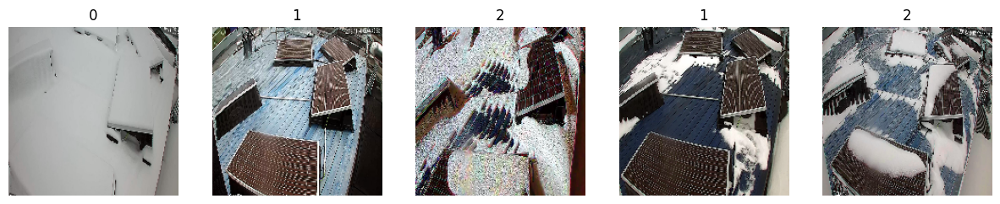

In [33]:
# Plot the first 5 images from the training set
fig, axs = plt.subplots(1, 5, figsize=(15, 3))
for i in range(5):
    axs[i].imshow(X_train[i])
    axs[i].set_title(y_train[i])
    axs[i].axis('off')
plt.show()

In [34]:
# One Hot Encoding the class labels
Y_train = tf.keras .utils.to_categorical(y_train, num_classes=3)
Y_test = tf.keras .utils.to_categorical(y_test, num_classes=3)

In [35]:
# Getting the shape of one of the train and test images
print(X_train[1].shape)
print(X_test[1].shape )

(180, 180, 3)
(180, 180, 3)


In [36]:
# Getting the shape of one of the train and test labels
print(Y_train[1].shape)
print(Y_test[1].shape )

(3,)
(3,)


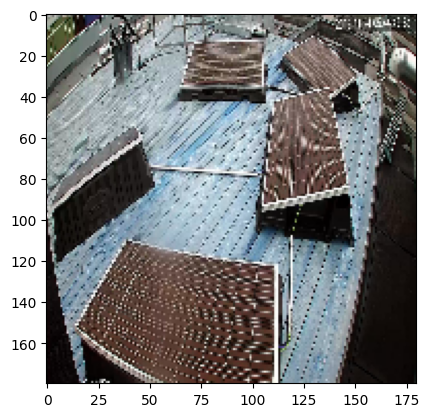

In [37]:
plt.imshow(X_train[1])

In [38]:
# Importing image data generator for data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Defining the data augmentation parameters for training set
train_datagen = ImageDataGenerator(
 rotation_range=30, # Randomly rotating the images up to 30 degrees
 width_shift_range=0.2, # Randomly shifting the images horizontally up to 20% of the width
 height_shift_range=0.2, # Randomly shifting the images vertically up to 20% of the height
 horizontal_flip=True, # Randomly flipping the images horizontally
 vertical_flip=True, # Randomly flipping the  images vertically
 shear_range=0.2, # Cropping some parts of the image
 zoom_range=0.2, # #zooming the image by 20%
#  brightness_range=[0.8, 1.2], # Adding a slight brightness varation
 fill_mode='nearest' # Filling in newly created pixels
)

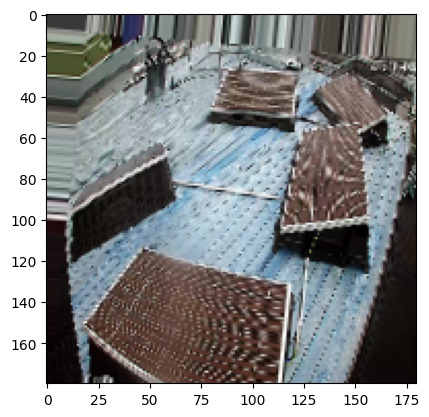

In [39]:
# Fitting the transformation to the training dataset
train_datagen.fit(X_train)

# showing sample of a transformation
plt.imshow(train_datagen.random_transform(X_train[1]))


In [40]:
# Normalizing the pixel values to the range of [0, 1].
X_train = X_train.astype("float32") / 255
X_test = X_test.astype("float32") / 255

In [41]:
# Building the model (Constructor Stage)

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (Conv2D, MaxPooling2D,
                                     Flatten, Dense, Dropout, BatchNormalization)
from tensorflow.keras.optimizers.legacy import (SGD, Adam, 
                                                RMSprop, Adagrad, Adadelta)


In [56]:
def cnn_model(regulariser = None,
              LR = 0.0003, epochs = 20,
              opt = SGD, title= None ):

    if isinstance(regulariser, ModelCheckpoint):

        print('This is for early stopping on the cnn model')
        # Defining the CNN Architecture

        cnn_model = Sequential()
        cnn_model.add(Conv2D(filters=32,kernel_size=(3,3),
                             input_shape=(img_height,img_width,3),
                             activation = 'relu',padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=64,kernel_size=(3,3),activation = 'relu', 
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=128,kernel_size=(3,3),activation = 'relu', 
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=256,kernel_size=(3,3),activation = 'relu', 
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=512,kernel_size=(3,3),activation = 'relu', 
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=1024,kernel_size=(3,3),activation = 'relu', 
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2), padding = 'same'))

        cnn_model.add(Flatten())
        cnn_model.add(Dense(1024,activation = 'relu'))
        cnn_model.add(Dropout(0.5))
        cnn_model.add(Dense(3,activation = 'softmax'))
        
        # printing the summary of the constructed data aug model
        cnn_model.summary()

        # Compiling the model, i.e. associating a loss function and the chosen variant

        cnn_model.compile(optimizer=opt(learning_rate=LR), loss='categorical_crossentropy', 
                          metrics =['accuracy'])


        # Training the ES model
        hist = cnn_model.fit(X_train, Y_train , batch_size=32, epochs=epochs,
                           validation_data = (X_test, Y_test), 
                             callbacks = tf.keras.callbacks.EarlyStopping(patience=5))

    elif isinstance(regulariser,ImageDataGenerator):


        print('This is for data aug on the cnn model')

        # Fitting the transformation to the training dataset
        train_datagen.fit(X_train)

        print('')

        cnn_model = Sequential()
        cnn_model.add(Conv2D(filters=32,kernel_size=(3,3),
                             input_shape=(img_height,img_width,3),
                             activation = 'relu',padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=64,kernel_size=(3,3),activation = 'relu',
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=128,kernel_size=(3,3),activation = 'relu',
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=256,kernel_size=(3,3),activation = 'relu', 
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=512,kernel_size=(3,3),activation = 'relu', 
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=1024,kernel_size=(3,3),activation = 'relu', 
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2), padding = 'same'))

        cnn_model.add(Flatten())
        cnn_model.add(Dense(1024,activation = 'relu'))
        cnn_model.add(Dropout(0.5))
        cnn_model.add(Dense(3,activation = 'softmax'))

        # printing the summary of the constructed data aug model
        cnn_model.summary()

        # Compiling the model, i.e. associating a loss function and the chosen variant

        cnn_model.compile(optimizer=opt(learning_rate=LR), loss='categorical_crossentropy',
                          metrics =['accuracy'])

        # Training the data_aug model
        hist = cnn_model.fit(train_datagen.flow(X_train, Y_train), batch_size=32,
                             epochs=epochs, validation_data = (X_test, Y_test))

    else:

        # Defining the CNN Architecture

        cnn_model = Sequential()
        cnn_model.add(Conv2D(filters=32,kernel_size=(3,3),
                             input_shape=(img_height,img_width,3),
                             activation = 'relu',padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=64,kernel_size=(3,3),activation = 'relu',
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=128,kernel_size=(3,3),activation = 'relu',
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=256,kernel_size=(3,3),activation = 'relu',
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=512,kernel_size=(3,3),activation = 'relu', 
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2)))

        cnn_model.add(Conv2D(filters=1024,kernel_size=(3,3),activation = 'relu', 
                             padding = 'same'))
        cnn_model.add(MaxPooling2D(pool_size=(2,2), padding = 'same'))
        
        if isinstance(regulariser,BatchNormalization):

            cnn_model.add(BatchNormalization())
            print(' this is for batch norm on the cnn model')


        cnn_model.add(Flatten())
        cnn_model.add(Dense(1024,activation = 'relu'))
        cnn_model.add(Dropout(0.5))
        cnn_model.add(Dense(3,activation = 'softmax'))
        
        
        # printing the summary of the constructed cnn model
        cnn_model.summary()

        # Compiling the model, i.e. associating a loss function and the chosen variant

        cnn_model.compile(optimizer=opt(learning_rate=LR), loss='categorical_crossentropy',
                          metrics =['accuracy'])

        # Training the model
        hist = cnn_model.fit(X_train, Y_train, batch_size=32, epochs=epochs,
                            validation_data = (X_test, Y_test))


    # Plotting training loss against validation loss
    plt.plot(hist.history['loss'], label='Training Loss')
    plt.plot(hist.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss {}'.format(title))
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    print('')

    # Plotting training and validation accuracy
    plt.plot(hist.history['accuracy'], label='Training Accuracy')
    plt.plot(hist.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy {}'.format(title))
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    print('')

    # Predicting the classes of the test set

    print('Classes of the Test set')
    y_pred = np.argmax(cnn_model.predict(X_test), axis = -1)

    print('')

    # Printing the classification report
    print('Classification report:')
    print(classification_report(y_test, y_pred))

    print('')

    # Plotting the confusion matrix
    print('Confusion Matrix:')
    plt.figure(dpi=200, figsize=(10,15))
    ConfusionMatrixDisplay.from_predictions(y_test,y_pred)
    plt.title('Confusion Matrix {}'.format(title))
    plt.show()

    print('')

    # checking the correct and incorrect predictions

    print('label predictions')
    correct_indices = np.nonzero(y_pred == y_test)[0]
    incorrect_indices = np.nonzero(y_pred != y_test)[0]
    print(len(correct_indices), "classified correctly")
    print(len(incorrect_indices), "classified incorrectly")



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 22, 22, 128)      0

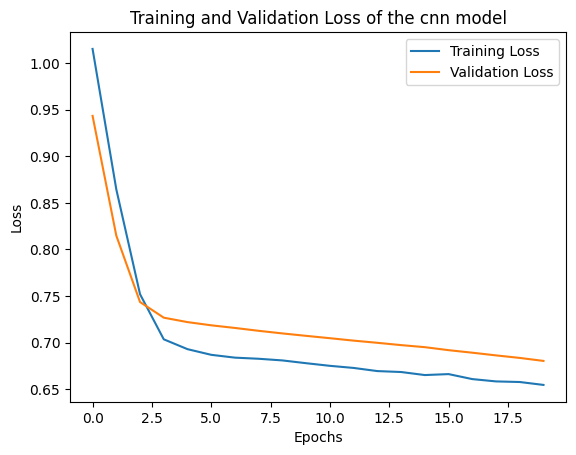

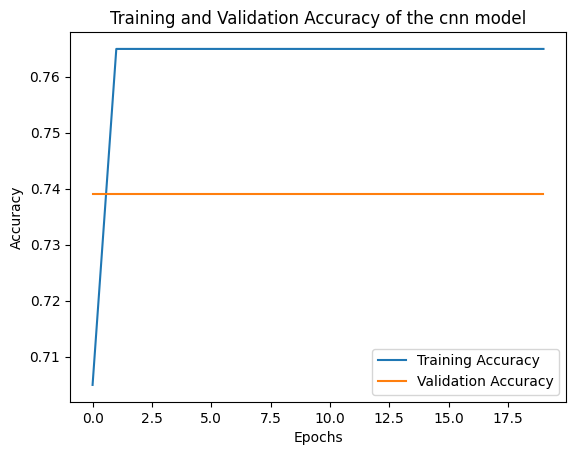


Classes of the Test set
30/30 [==============================] - 1s 18ms/step

Classification report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       171
           1       0.74      1.00      0.85       705
           2       0.00      0.00      0.00        78

    accuracy                           0.74       954
   macro avg       0.25      0.33      0.28       954
weighted avg       0.55      0.74      0.63       954


Confusion Matrix:


<Figure size 2000x3000 with 0 Axes>

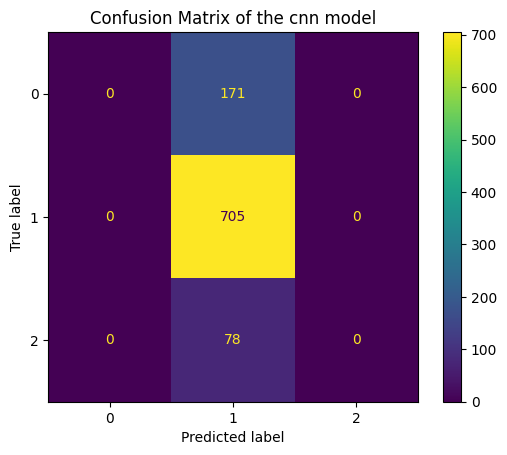


label predictions
705 classified correctly
249 classified incorrectly


In [43]:
cnn_model( title = "of the cnn model")

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 90, 90, 32)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 45, 45, 64)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 45, 45, 128)       73856     
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 22, 22, 128)     

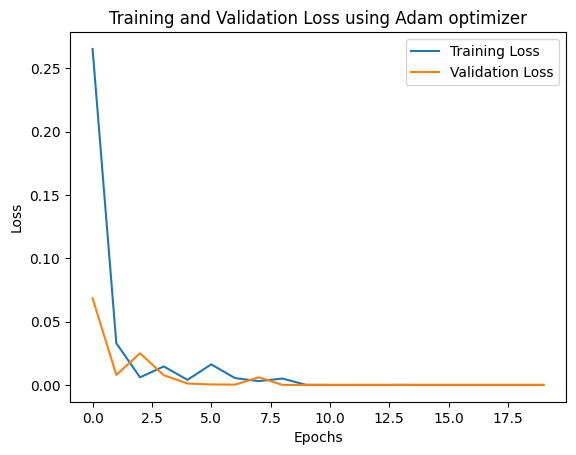

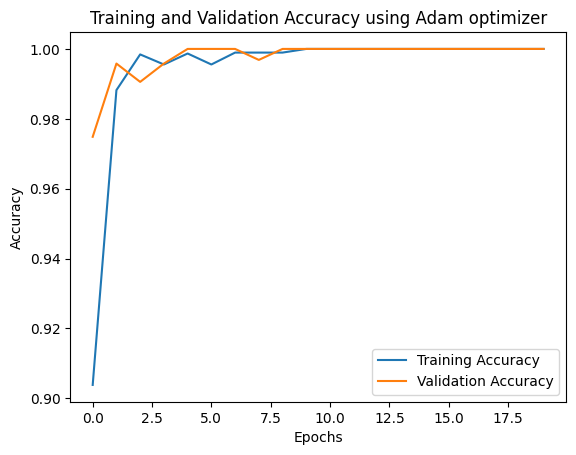


Classes of the Test set
30/30 [==============================] - 1s 17ms/step

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       171
           1       1.00      1.00      1.00       705
           2       1.00      1.00      1.00        78

    accuracy                           1.00       954
   macro avg       1.00      1.00      1.00       954
weighted avg       1.00      1.00      1.00       954


Confusion Matrix:


<Figure size 2000x3000 with 0 Axes>

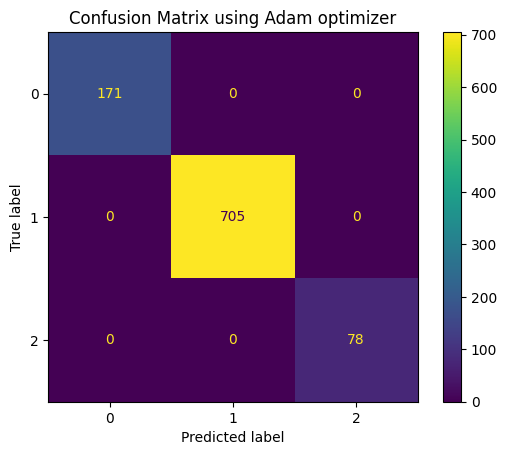


label predictions
954 classified correctly
0 classified incorrectly


In [44]:
cnn_model(opt= Adam, title = "using Adam optimizer")

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 90, 90, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 45, 45, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 45, 45, 128)       73856     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 22, 22, 128)     

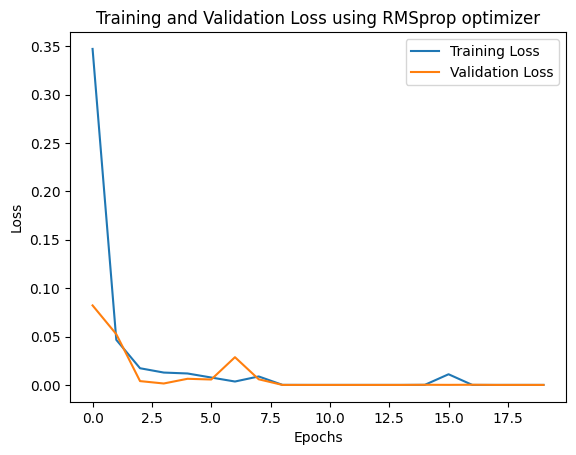

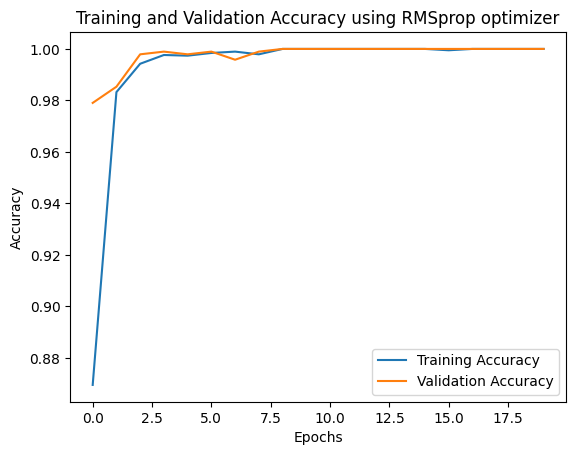


Classes of the Test set
30/30 [==============================] - 1s 18ms/step

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       171
           1       1.00      1.00      1.00       705
           2       1.00      1.00      1.00        78

    accuracy                           1.00       954
   macro avg       1.00      1.00      1.00       954
weighted avg       1.00      1.00      1.00       954


Confusion Matrix:


<Figure size 2000x3000 with 0 Axes>

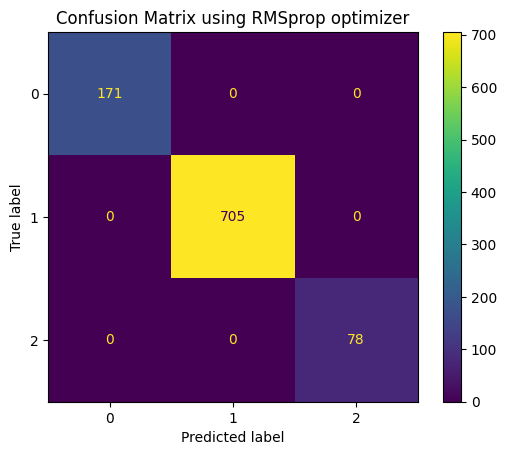


label predictions
954 classified correctly
0 classified incorrectly


In [45]:
cnn_model(opt=RMSprop, title = "using RMSprop optimizer")

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 90, 90, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 45, 45, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 45, 45, 128)       73856     
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 22, 22, 128)     

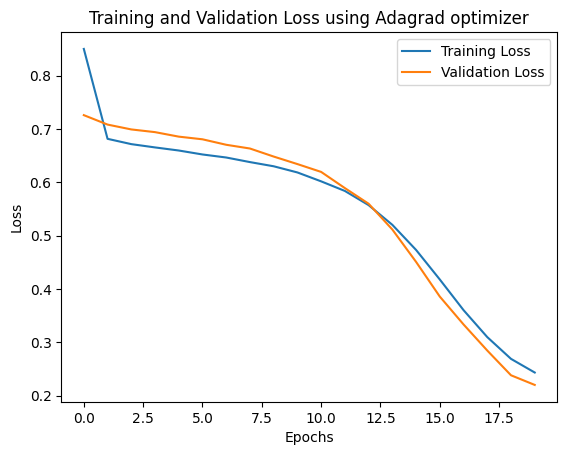

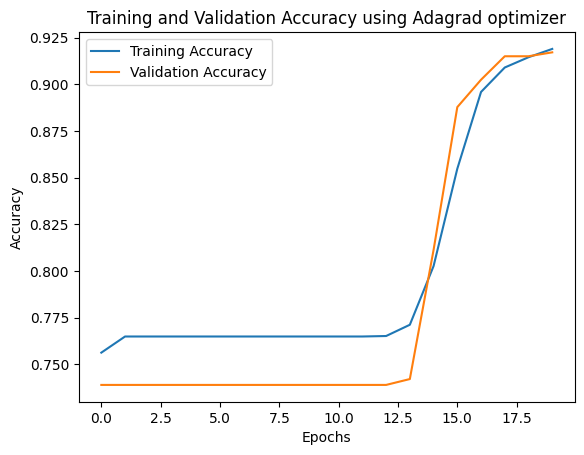


Classes of the Test set
30/30 [==============================] - 1s 18ms/step

Classification report:
              precision    recall  f1-score   support

           0       0.81      0.99      0.89       171
           1       0.95      1.00      0.97       705
           2       0.00      0.00      0.00        78

    accuracy                           0.92       954
   macro avg       0.58      0.66      0.62       954
weighted avg       0.85      0.92      0.88       954


Confusion Matrix:


<Figure size 2000x3000 with 0 Axes>

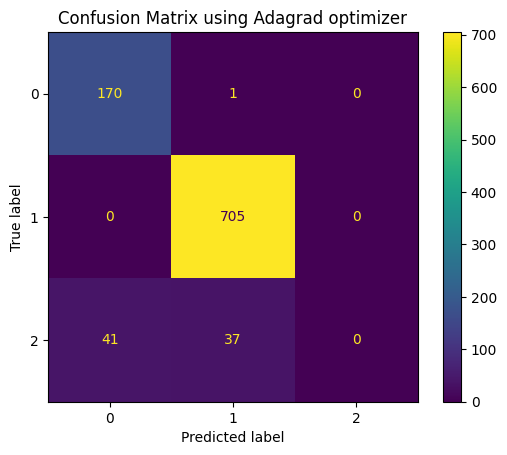


label predictions
875 classified correctly
79 classified incorrectly


In [46]:
cnn_model(opt=Adagrad, title = "using Adagrad optimizer")

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_30 (Conv2D)          (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_30 (MaxPoolin  (None, 90, 90, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_31 (Conv2D)          (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_31 (MaxPoolin  (None, 45, 45, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_32 (Conv2D)          (None, 45, 45, 128)       73856     
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 22, 22, 128)     

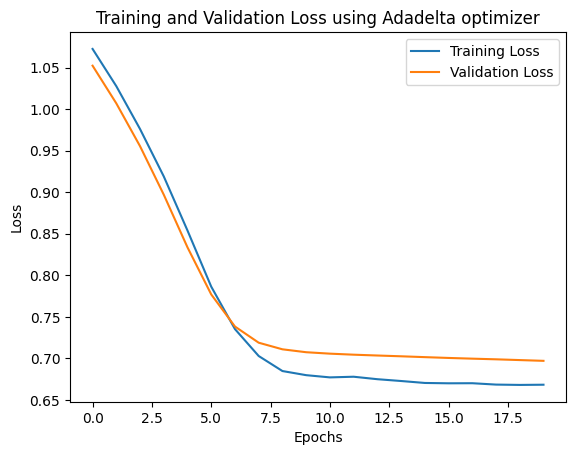

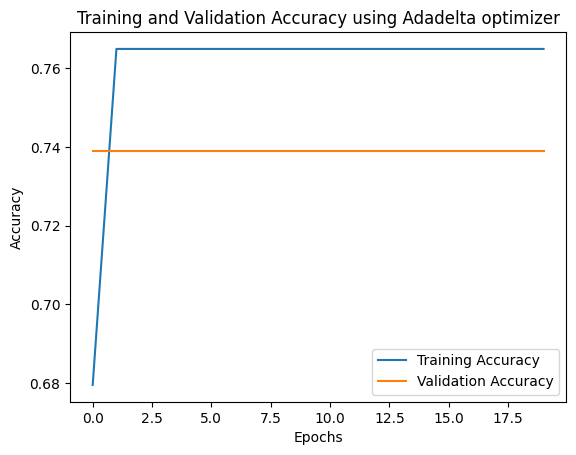


Classes of the Test set
30/30 [==============================] - 1s 18ms/step

Classification report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       171
           1       0.74      1.00      0.85       705
           2       0.00      0.00      0.00        78

    accuracy                           0.74       954
   macro avg       0.25      0.33      0.28       954
weighted avg       0.55      0.74      0.63       954


Confusion Matrix:


<Figure size 2000x3000 with 0 Axes>

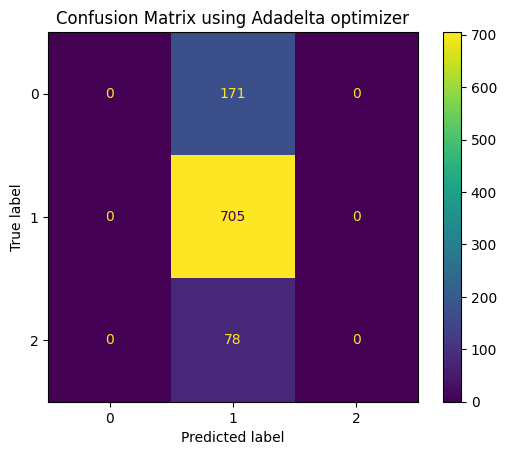


label predictions
705 classified correctly
249 classified incorrectly


In [48]:
cnn_model(opt= Adadelta, title = "using Adadelta optimizer")

This is for data aug on the cnn model

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_66 (Conv2D)          (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_66 (MaxPoolin  (None, 90, 90, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_67 (Conv2D)          (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_67 (MaxPoolin  (None, 45, 45, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_68 (Conv2D)          (None, 45, 45, 128)       73856     
                                                                 
 max_pooling2d

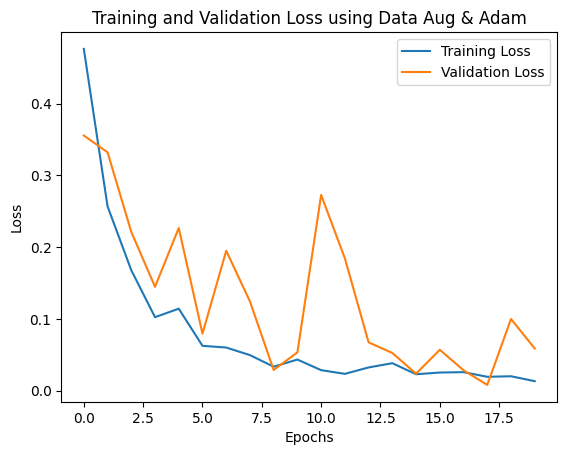

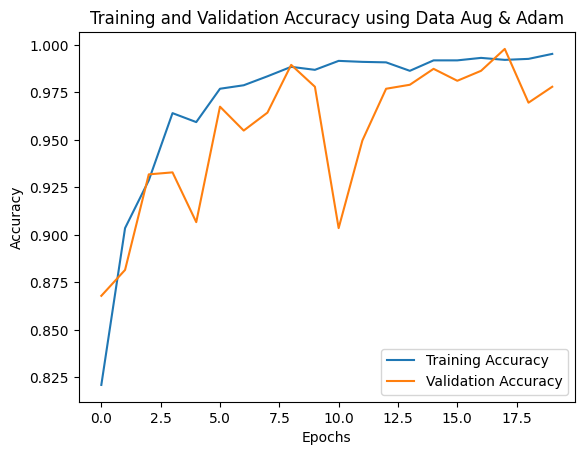


Classes of the Test set
30/30 [==============================] - 1s 17ms/step

Classification report:
              precision    recall  f1-score   support

           0       0.99      0.94      0.96       171
           1       0.99      1.00      0.99       705
           2       0.88      0.87      0.88        78

    accuracy                           0.98       954
   macro avg       0.95      0.94      0.94       954
weighted avg       0.98      0.98      0.98       954


Confusion Matrix:


<Figure size 2000x3000 with 0 Axes>

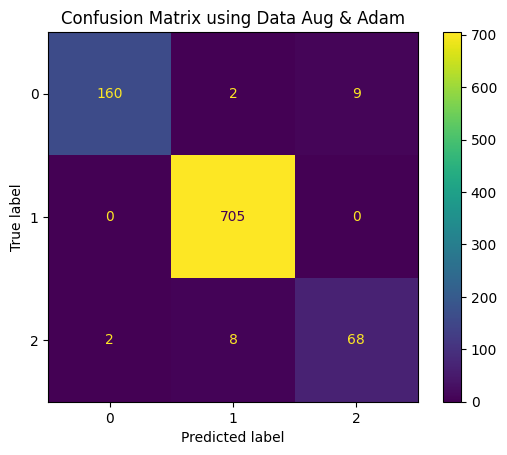


label predictions
933 classified correctly
21 classified incorrectly


In [57]:
cnn_model(opt=Adam, regulariser=ImageDataGenerator(), title = "using Data Aug & Adam")

 this is for batch norm on the cnn model
Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_84 (Conv2D)          (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_84 (MaxPoolin  (None, 90, 90, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_85 (Conv2D)          (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_85 (MaxPoolin  (None, 45, 45, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_86 (Conv2D)          (None, 45, 45, 128)       73856     
                                                                 
 max_pooling

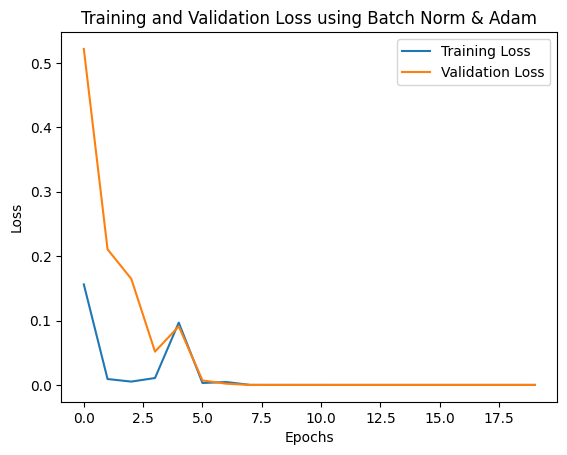

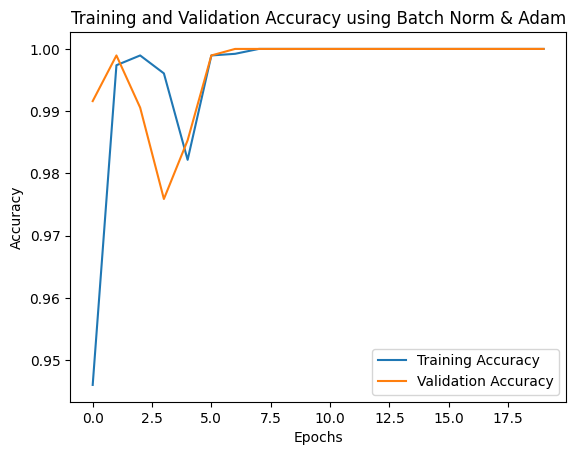


Classes of the Test set
30/30 [==============================] - 1s 13ms/step

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       171
           1       1.00      1.00      1.00       705
           2       1.00      1.00      1.00        78

    accuracy                           1.00       954
   macro avg       1.00      1.00      1.00       954
weighted avg       1.00      1.00      1.00       954


Confusion Matrix:


<Figure size 2000x3000 with 0 Axes>

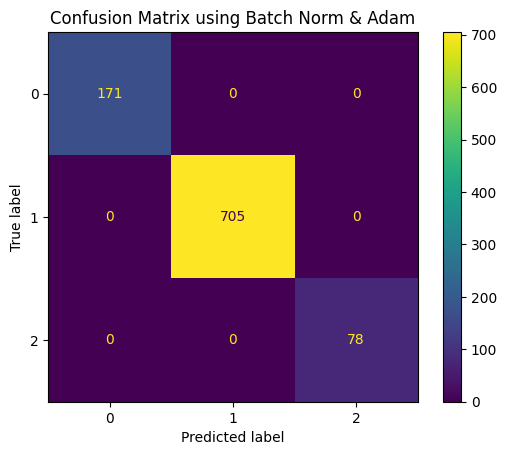


label predictions
954 classified correctly
0 classified incorrectly


In [60]:
cnn_model(opt=Adam, regulariser= BatchNormalization(), title = "using Batch Norm & Adam")

This is for early stopping on the cnn model
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_78 (Conv2D)          (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_78 (MaxPoolin  (None, 90, 90, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_79 (Conv2D)          (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_79 (MaxPoolin  (None, 45, 45, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_80 (Conv2D)          (None, 45, 45, 128)       73856     
                                                                 
 max_pool

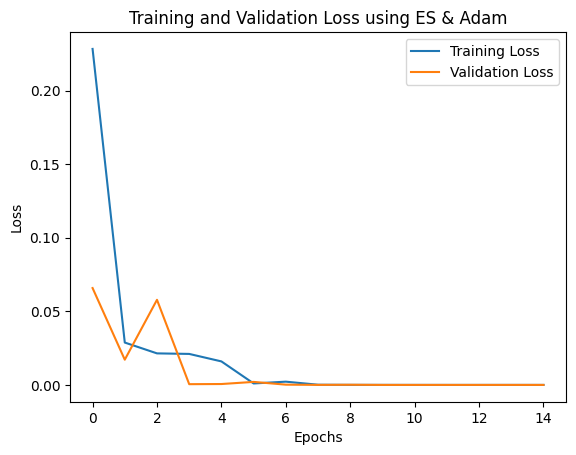

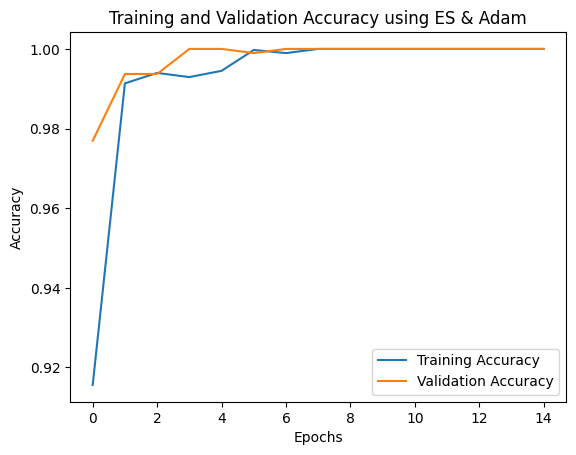


Classes of the Test set
30/30 [==============================] - 1s 18ms/step

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       171
           1       1.00      1.00      1.00       705
           2       1.00      1.00      1.00        78

    accuracy                           1.00       954
   macro avg       1.00      1.00      1.00       954
weighted avg       1.00      1.00      1.00       954


Confusion Matrix:


<Figure size 2000x3000 with 0 Axes>

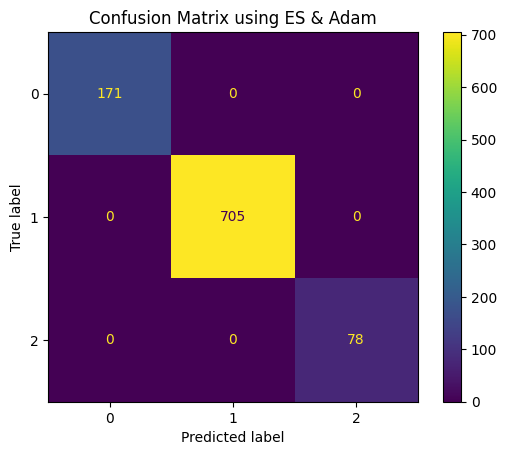


label predictions
954 classified correctly
0 classified incorrectly


In [59]:
cnn_model(opt=Adam, regulariser= ModelCheckpoint('Filepath'), title = "using ES & Adam")

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_96 (Conv2D)          (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_96 (MaxPoolin  (None, 90, 90, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_97 (Conv2D)          (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_97 (MaxPoolin  (None, 45, 45, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_98 (Conv2D)          (None, 45, 45, 128)       73856     
                                                                 
 max_pooling2d_98 (MaxPoolin  (None, 22, 22, 128)    

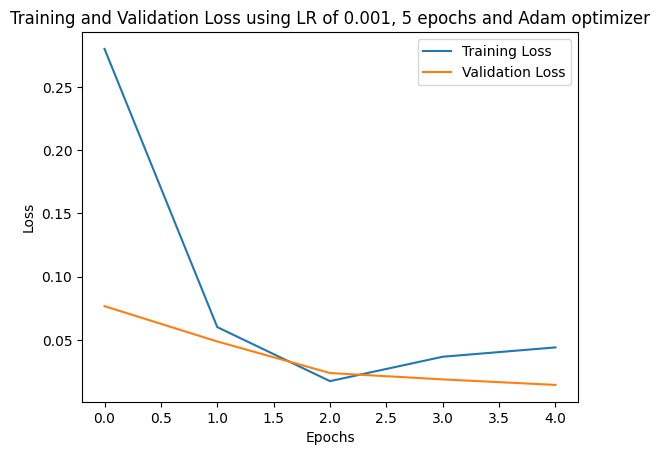

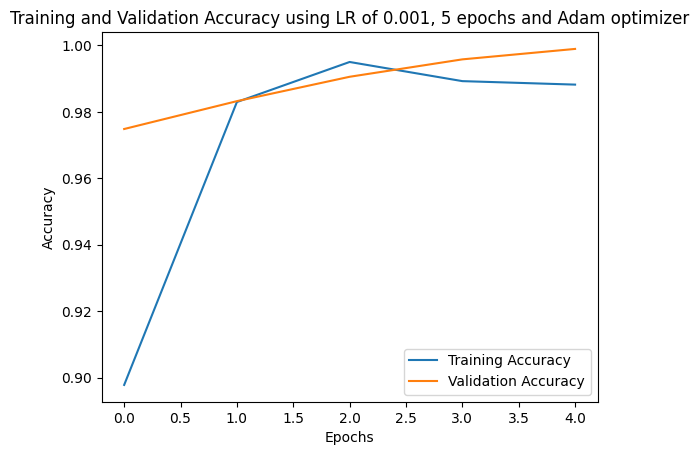


Classes of the Test set
30/30 [==============================] - 1s 19ms/step

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       171
           1       1.00      1.00      1.00       705
           2       1.00      0.99      0.99        78

    accuracy                           1.00       954
   macro avg       1.00      1.00      1.00       954
weighted avg       1.00      1.00      1.00       954


Confusion Matrix:


<Figure size 2000x3000 with 0 Axes>

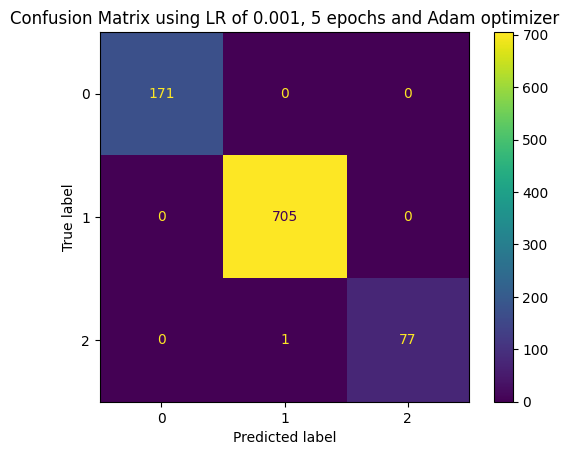


label predictions
953 classified correctly
1 classified incorrectly


In [88]:
cnn_model(opt=Adam, LR=0.001, epochs=5, title='using LR of 0.001, 5 epochs and Adam optimizer' )

In [62]:
from tensorflow.keras.applications import VGG16, VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg19 import preprocess_input 

In [75]:
# Loading the pretrained VGG-16 model (excluding the top fully connected layers)
vgg16_base_model = VGG16(weights='imagenet', include_top=False)

# Adding top layers for classification
x = vgg16_base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(3, activation='softmax')(x)

# Creating the full model
vgg16_model = Model(inputs=vgg16_base_model.input, outputs=predictions)

# Compiling the model
vgg16_model.compile(optimizer=Adam(lr=0.0003), 
                    loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Data preprocessing
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator = train_datagen.flow(X_train, y_train, batch_size=32)
test_generator = test_datagen.flow(X_test, y_test, batch_size=32)

# Training the model
vgg16_hist = vgg16_model.fit(train_generator, steps_per_epoch=len(X_train) // 32,
                             epochs=20,
                             validation_data=test_generator,
                             validation_steps=len(X_test) // 32)

# Evaluating the model on the test set
test_loss, test_acc = vgg16_model.evaluate(test_generator, steps=len(X_test) // 32)

print("Test accuracy:", test_acc)


Epoch 1/20
119/119 [==============================] - 26s 210ms/step - loss: 0.7951 - accuracy: 0.7582 - val_loss: 0.7717 - val_accuracy: 0.7414
Epoch 2/20
119/119 [==============================] - 23s 194ms/step - loss: 0.7099 - accuracy: 0.7645 - val_loss: 0.7325 - val_accuracy: 0.7414
Epoch 3/20
119/119 [==============================] - 23s 196ms/step - loss: 0.6996 - accuracy: 0.7659 - val_loss: 0.7579 - val_accuracy: 0.7360
Epoch 4/20
119/119 [==============================] - 23s 194ms/step - loss: 0.7038 - accuracy: 0.7648 - val_loss: 0.7640 - val_accuracy: 0.7403
Epoch 5/20
119/119 [==============================] - 23s 194ms/step - loss: 0.7056 - accuracy: 0.7648 - val_loss: 0.7421 - val_accuracy: 0.7414
Epoch 6/20
119/119 [==============================] - 23s 196ms/step - loss: 0.7016 - accuracy: 0.7656 - val_loss: 0.7414 - val_accuracy: 0.7371
Epoch 7/20
119/119 [==============================] - 23s 194ms/step - loss: 0.7024 - accuracy: 0.7643 - val_loss: 0.7464 - val_ac

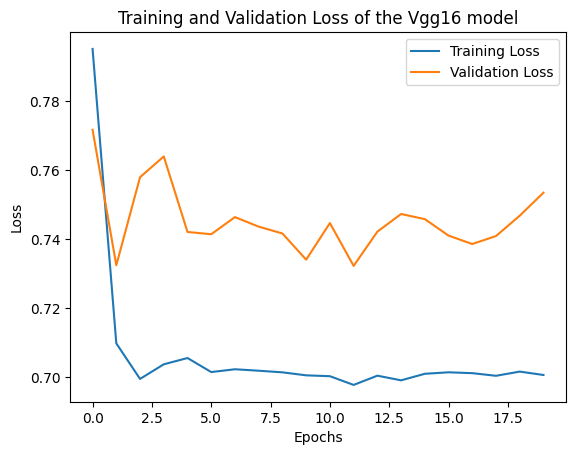

In [76]:
# Plotting training loss against validation loss
plt.plot(vgg16_hist.history['loss'], label='Training Loss')
plt.plot(vgg16_hist.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss of the Vgg16 model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

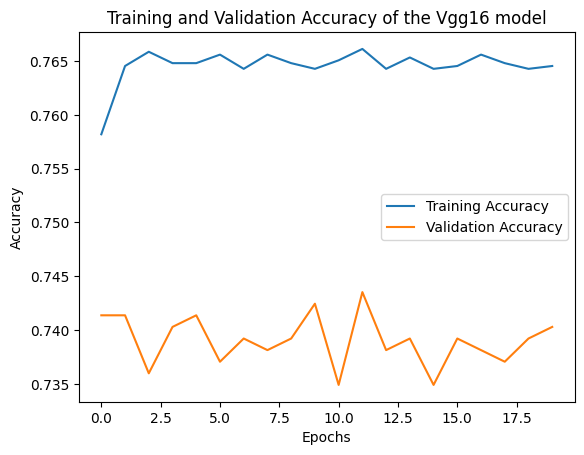

In [77]:
# Plotting training and validation accuracy
plt.plot(vgg16_hist.history['accuracy'], label='Training Accuracy')
plt.plot(vgg16_hist.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy of the Vgg16 model')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [78]:
# Predicting the classes of the test set

print('Classes of the Test set')
vgg16_y_pred = np.argmax(vgg16_model.predict(X_test), axis = -1)

Classes of the Test set
30/30 [==============================] - 3s 95ms/step


In [79]:
# Printing the classification report
print('Classification report:')
print(classification_report(y_test, vgg16_y_pred))

Classification report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       171
           1       0.74      1.00      0.85       705
           2       0.00      0.00      0.00        78

    accuracy                           0.74       954
   macro avg       0.25      0.33      0.28       954
weighted avg       0.55      0.74      0.63       954



Confusion Matrix:


<Figure size 2000x3000 with 0 Axes>

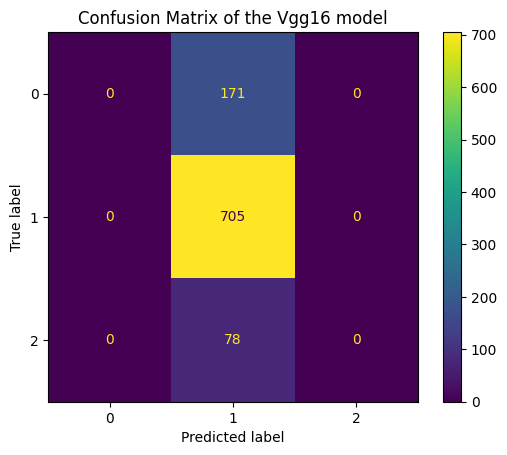

In [80]:
# Plotting the confusion matrix
print('Confusion Matrix:')
plt.figure(dpi=200, figsize=(10,15))
ConfusionMatrixDisplay.from_predictions(y_test,vgg16_y_pred)
plt.title('Confusion Matrix of the Vgg16 model')
plt.show()

In [81]:
# checking the correct and incorrect predictions

print('label predictions')
correct_indices = np.nonzero(vgg16_y_pred == y_test)[0]
incorrect_indices = np.nonzero(vgg16_y_pred != y_test)[0]
print(len(correct_indices), "classified correctly")
print(len(incorrect_indices), "classified incorrectly")


label predictions
705 classified correctly
249 classified incorrectly


In [69]:
# Loading the pretrained VGG-19 model (excluding the top fully connected layers)
vgg19_base_model = VGG19(weights='imagenet', include_top=False)

# Adding top layers for classification
x = vgg19_base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(3, activation='softmax')(x)

# Creating the full model
vgg19_model = Model(inputs=vgg19_base_model.input, outputs=predictions)

# Compiling the model
vgg19_model.compile(optimizer=Adam(lr=0.0003), loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])

# Data preprocessing
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator = train_datagen.flow(X_train, y_train, batch_size=32)
test_generator = test_datagen.flow(X_test, y_test, batch_size=32)

# Training the model
vgg19_hist = vgg19_model.fit(train_generator, steps_per_epoch=len(X_train) // 32, 
                             epochs=20, 
                            validation_data=test_generator, 
                             validation_steps=len(X_test) // 32)

# Evaluating the model on the test set
test_loss, test_acc = vgg19_model.evaluate(test_generator, steps=len(X_test) // 32)

print("Test accuracy:", test_acc)

Epoch 1/20
119/119 [==============================] - 30s 218ms/step - loss: 0.7502 - accuracy: 0.7532 - val_loss: 0.7350 - val_accuracy: 0.7435
Epoch 2/20
119/119 [==============================] - 24s 201ms/step - loss: 0.7029 - accuracy: 0.7648 - val_loss: 0.7425 - val_accuracy: 0.7392
Epoch 3/20
119/119 [==============================] - 23s 195ms/step - loss: 0.7038 - accuracy: 0.7653 - val_loss: 0.7292 - val_accuracy: 0.7446
Epoch 4/20
119/119 [==============================] - 23s 195ms/step - loss: 0.7037 - accuracy: 0.7645 - val_loss: 0.7399 - val_accuracy: 0.7392
Epoch 5/20
119/119 [==============================] - 23s 196ms/step - loss: 0.6999 - accuracy: 0.7645 - val_loss: 0.7450 - val_accuracy: 0.7381
Epoch 6/20
119/119 [==============================] - 23s 195ms/step - loss: 0.7020 - accuracy: 0.7653 - val_loss: 0.7329 - val_accuracy: 0.7435
Epoch 7/20
119/119 [==============================] - 23s 194ms/step - loss: 0.7015 - accuracy: 0.7648 - val_loss: 0.7459 - val_ac

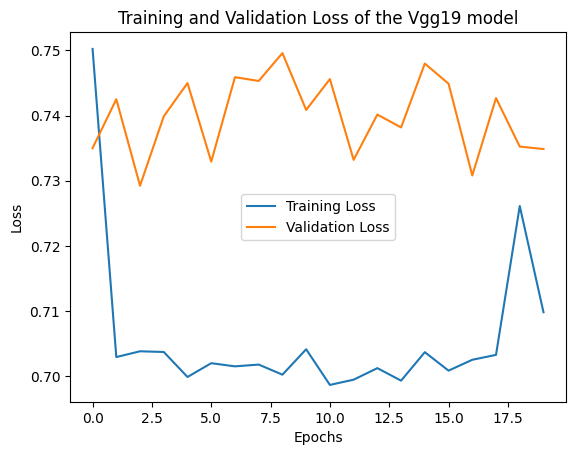

In [70]:
# Plotting training loss against validation loss
plt.plot(vgg19_hist.history['loss'], label='Training Loss')
plt.plot(vgg19_hist.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss of the Vgg19 model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

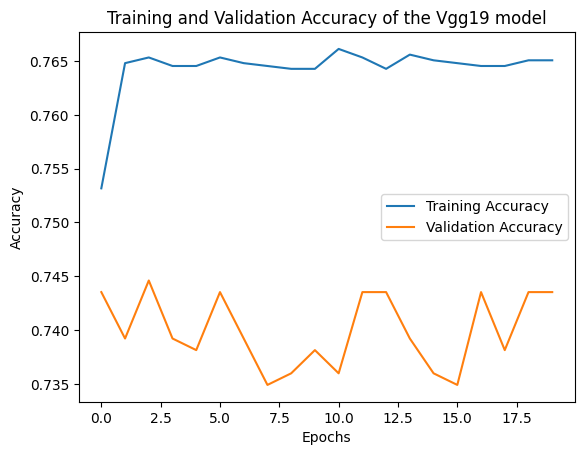

In [71]:
# Plotting training and validation accuracy
plt.plot(vgg19_hist.history['accuracy'], label='Training Accuracy')
plt.plot(vgg19_hist.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy of the Vgg19 model')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [82]:
# Predicting the classes of the test set

print('Classes of the Test set')
vgg19_y_pred = np.argmax(vgg19_model.predict(X_test), axis = -1)

Classes of the Test set
30/30 [==============================] - 3s 113ms/step


In [83]:
# Printing the classification report
print('Classification report:')
print(classification_report(y_test, vgg19_y_pred))

Classification report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       171
           1       0.74      1.00      0.85       705
           2       0.00      0.00      0.00        78

    accuracy                           0.74       954
   macro avg       0.25      0.33      0.28       954
weighted avg       0.55      0.74      0.63       954



Confusion Matrix:


<Figure size 2000x3000 with 0 Axes>

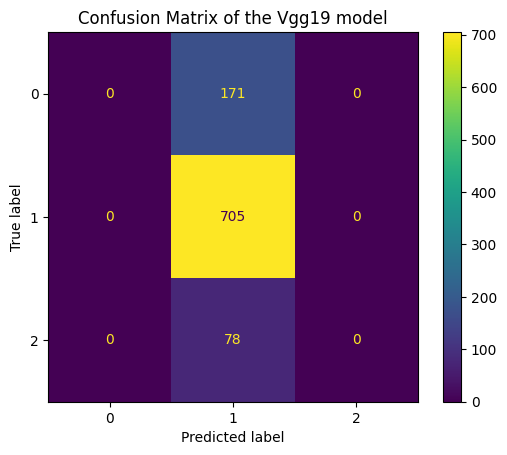

In [86]:
# Plotting the confusion matrix
print('Confusion Matrix:')
plt.figure(dpi=200, figsize=(10,15))
ConfusionMatrixDisplay.from_predictions(y_test,vgg19_y_pred)
plt.title('Confusion Matrix of the Vgg19 model')
plt.show()

In [87]:
# checking the correct and incorrect predictions

print('label predictions')
correct_indices = np.nonzero(vgg19_y_pred == y_test)[0]
incorrect_indices = np.nonzero(vgg19_y_pred != y_test)[0]
print(len(correct_indices), "classified correctly")
print(len(incorrect_indices), "classified incorrectly")

label predictions
705 classified correctly
249 classified incorrectly
